# Feature Extraction EfficientNetB3

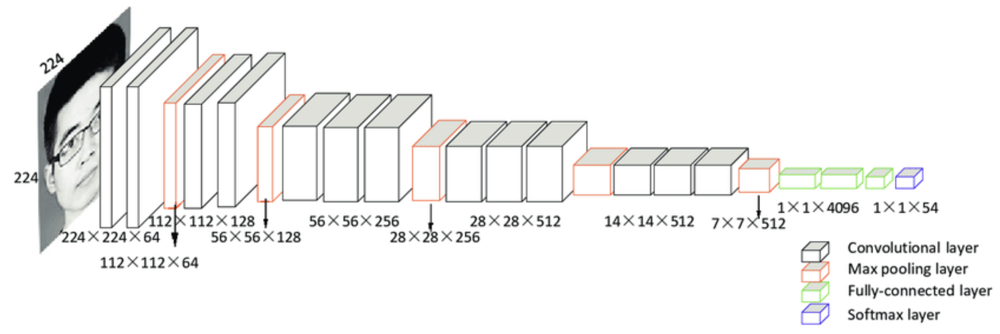

Pei, Zhao & Xu, Hang & Zhang, Yanning & Guo, Min & Yang, Yee-Hong. (2019). Face Recognition via Deep Learning Using Data Augmentation Based on Orthogonal Experiments. Electronics. 8. 1088. 10.3390/electronics8101088. 

## Data Loading

In [23]:
from src.preprocessing import CustomDataGenerator
from src.dataloader import read_train, read_val
X_train, y_train = read_train()
X_val, y_val = read_val()

KeyboardInterrupt: 

In [ ]:

def check_class(X_train, y_train, class_name):

    import matplotlib.pyplot as plt
    idx = config.LABELS.index(class_name)
    X_train_wf = X_train[y_train == idx].copy()

    rows = len(X_train_wf) // 5 + 1
    cols = 5

    fig, ax = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    ax = ax.ravel()
    for i, img in enumerate(X_train_wf):
        ax[i].imshow(img)
        ax[i].axis('off')

    plt.tight_layout()

# check_class(X_train, y_train, 'Woven fabric');


## Network Extraction

Use keras to extract the network from the VGG16 model. The network is then saved to a file for later use.

In [1]:
import keras
from src import config
from keras.applications.efficientnet import EfficientNetB3, preprocess_input
# set cpu as available physical device
import tensorflow as tf
# tf.config.experimental.set_visible_devices([], 'GPU')

INPUT_SHAPE = (config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS)
model = keras.applications.EfficientNetB3(weights="imagenet", 
                                 include_top=True)

2023-11-29 22:20:27.075886: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-29 22:20:27.098397: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-29 22:20:27.466459: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-11-29 22:20:28.049258: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_UNKNOWN: unknown error
2023-11-29 22:20:28.049280: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:168] retrievin

In [6]:
len(['input_1',
 'rescaling',
 'normalization',
 'rescaling_1',
 'stem_conv_pad',
 'stem_conv',
 'stem_bn',
 'stem_activation',
 'block1a_dwconv',
 'block1a_bn',
 'block1a_activation',
 'block1a_se_squeeze',
 'block1a_se_reshape',
 'block1a_se_reduce',])

14

In [5]:
[layer.name for layer in model.layers]

['input_1',
 'rescaling',
 'normalization',
 'rescaling_1',
 'stem_conv_pad',
 'stem_conv',
 'stem_bn',
 'stem_activation',
 'block1a_dwconv',
 'block1a_bn',
 'block1a_activation',
 'block1a_se_squeeze',
 'block1a_se_reshape',
 'block1a_se_reduce',
 'block1a_se_expand',
 'block1a_se_excite',
 'block1a_project_conv',
 'block1a_project_bn',
 'block1b_dwconv',
 'block1b_bn',
 'block1b_activation',
 'block1b_se_squeeze',
 'block1b_se_reshape',
 'block1b_se_reduce',
 'block1b_se_expand',
 'block1b_se_excite',
 'block1b_project_conv',
 'block1b_project_bn',
 'block1b_drop',
 'block1b_add',
 'block2a_expand_conv',
 'block2a_expand_bn',
 'block2a_expand_activation',
 'block2a_dwconv_pad',
 'block2a_dwconv',
 'block2a_bn',
 'block2a_activation',
 'block2a_se_squeeze',
 'block2a_se_reshape',
 'block2a_se_reduce',
 'block2a_se_expand',
 'block2a_se_excite',
 'block2a_project_conv',
 'block2a_project_bn',
 'block2b_expand_conv',
 'block2b_expand_bn',
 'block2b_expand_activation',
 'block2b_dwconv'

In [2]:
model.summary()

Model: "efficientnetb3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 300, 300, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 300, 300, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 300, 300, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     (None, 300, 300, 3)          0         ['normalization[0

In [4]:
[layer.name for layer in model.layers]

len(['input_1',
 'rescaling',
 'normalization',
 'rescaling_1',
 'stem_conv_pad',
 'stem_conv',
 'stem_bn',
 'stem_activation',
 'block1a_dwconv',
 'block1a_bn',
 'block1a_activation',
 'block1a_se_squeeze',
 'block1a_se_reshape',
 'block1a_se_reduce',
 'block1a_se_expand',
 'block1a_se_excite',
 'block1a_project_conv',
 'block1a_project_bn',
 'block1b_dwconv',
 'block1b_bn',
 'block1b_activation',
 'block1b_se_squeeze',
 'block1b_se_reshape',
 'block1b_se_reduce',
 'block1b_se_expand',
 'block1b_se_excite',
 'block1b_project_conv',
 'block1b_project_bn',
 'block1b_drop',
 'block1b_add',
 'block2a_expand_conv',
 'block2a_expand_bn',
 'block2a_expand_activation',
 'block2a_dwconv_pad',
 'block2a_dwconv',
 'block2a_bn',
 'block2a_activation',
 'block2a_se_squeeze',
 'block2a_se_reshape',
 'block2a_se_reduce',
 'block2a_se_expand',
 'block2a_se_excite',
 'block2a_project_conv',
 'block2a_project_bn',
 'block2b_expand_conv',
 'block2b_expand_bn',
 'block2b_expand_activation',
 'block2b_dwconv',
 'block2b_bn',
 'block2b_activation',
 'block2b_se_squeeze',
 'block2b_se_reshape',
 'block2b_se_reduce',
 'block2b_se_expand',
 'block2b_se_excite',
 'block2b_project_conv',
 'block2b_project_bn',
 'block2b_drop',
 'block2b_add',
 'block2c_expand_conv',
 'block2c_expand_bn',
 'block2c_expand_activation',
 'block2c_dwconv',
 'block2c_bn',
 'block2c_activation',
 'block2c_se_squeeze',
 'block2c_se_reshape',
 'block2c_se_reduce',
 'block2c_se_expand',
 'block2c_se_excite',
 'block2c_project_conv',
 'block2c_project_bn',
 'block2c_drop',
 'block2c_add',
 'block3a_expand_conv',])

75

In [ ]:
INPUT_SHAPE = (config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS)
model = keras.applications.EfficientNetB3(weights="imagenet", 
                                 include_top=True)

extractor = keras.Model(inputs=model.inputs, outputs=model.layers[-3].output)
resize_layer = keras.layers.Resizing(300, 300, interpolation='bilinear', name='resize')
preprocess_input_layer = keras.layers.Lambda(preprocess_input, name='preprocess_input')
extractor = keras.Sequential([
    resize_layer,
    preprocess_input_layer,
    extractor
])

extractor(X_train[:1])
extractor.summary()

2023-11-28 18:20:24.050413: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-11-28 18:20:24.162420: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:231] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.9
2023-11-28 18:20:24.162429: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:234] Used ptxas at ptxas
2023-11-28 18:20:24.162476: W tensorflow/compiler/xla/stream_executor/gpu/redzone_allocator.cc:318] UNIMPLEMENTED: ptxas ptxas too old. Falling back to the driver to compile.
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2023-11-28 18:20:24.230688: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resize (Resizing)           (1, 300, 300, 3)          0         
                                                                 
 preprocess_input (Lambda)   (1, 300, 300, 3)          0         
                                                                 
 model (Functional)          (None, 1536)              10783535  
                                                                 
Total params: 10783535 (41.14 MB)
Trainable params: 10696232 (40.80 MB)
Non-trainable params: 87303 (341.03 KB)
_________________________________________________________________


In [ ]:
from skimage.transform import resize
import numpy as np
import pandas as pd

# X_exp, y_exp = X_train[:2000], y_train[:2000]
# X_exp, y_exp = X_train_sample, y_train_sample
# X_exp = [preprocess_input(resize(x, (300, 300), preserve_range=True)) for x in X_exp]
df_ext = pd.DataFrame(extractor.predict(np.array(X_train)))
df_ext.shape

In [6]:
from skimage.transform import resize
import numpy as np
import pandas as pd

X_exp, y_exp = X_train[:2000], y_train[:2000]
# X_exp, y_exp = X_train_sample, y_train_sample
# X_exp = [preprocess_input(resize(x, (300, 300), preserve_range=True)) for x in X_exp]
df_ext = pd.DataFrame(extractor.predict(np.array(X_exp)))
df_ext.shape

63/63 [==============================] - 10s 134ms/step


(2000, 1536)

In [8]:
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
# sns.set(style='white', context='poster', rc={'figure.figsize':(10,5)})
reducer = umap.UMAP()
sc = StandardScaler()
embedding = reducer.fit_transform(sc.fit_transform(df_ext))
embedding.shape

/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


(2000, 2)

Text(0.5, 1.0, 'UMAP projection of EfficientNetB0 1280 features')

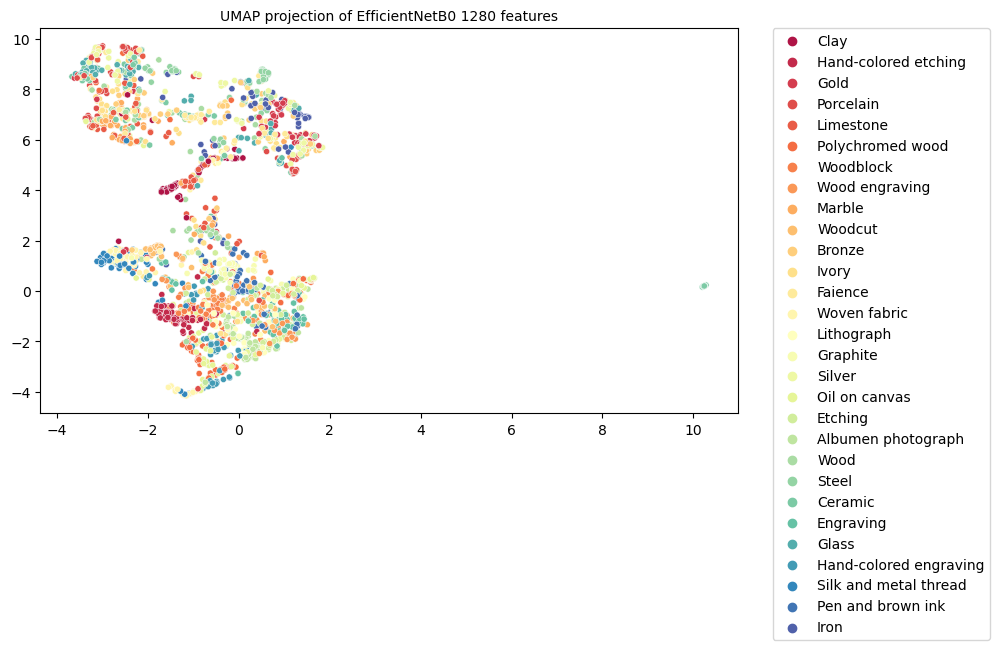

In [9]:
# REset the default matplotlib color cycle
plt.figure(figsize=(9,5))
y_labels = [config.LABELS[y] for y in y_exp]

sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=y_labels, marker='o', s=20,
                 palette='Spectral', legend='full')
# plt.legend([])
# place legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('UMAP projection of EfficientNetB0 1280 features', fontsize=10)

In [ ]:
# REset the default matplotlib color cycle
# plt.figure(figsize=(15,10))
# y_labels = [config.LABELS[y] for y in y_exp[embedding[:, 0]>4]]
# embedding_WO = embedding[embedding[:, 0]>4]
# sns.scatterplot(x=embedding_WO[:, 0], y=embedding_WO[:, 1], hue=y_labels, marker='o', s=10,
#                  palette='Spectral', legend='full')
# plt.legend([])

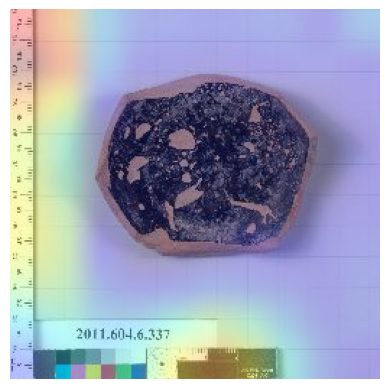

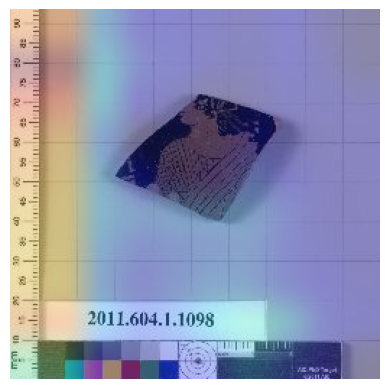

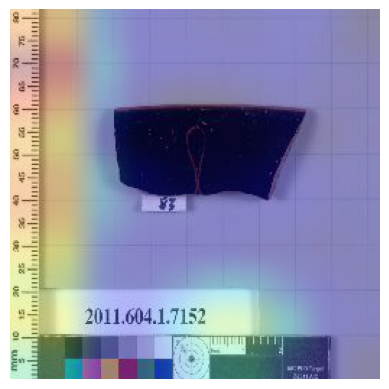

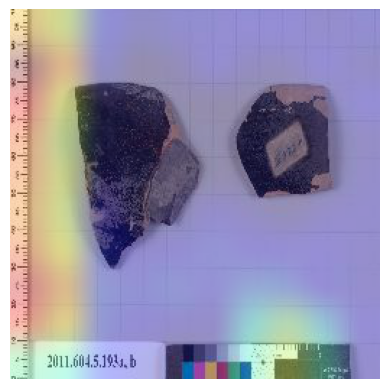

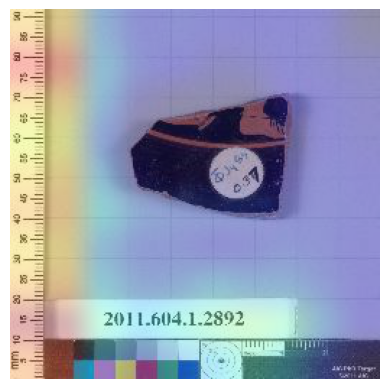

...

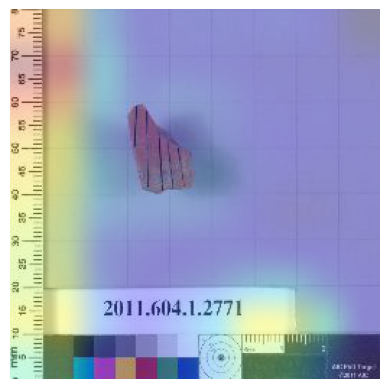

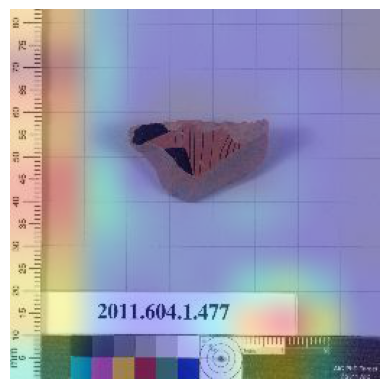

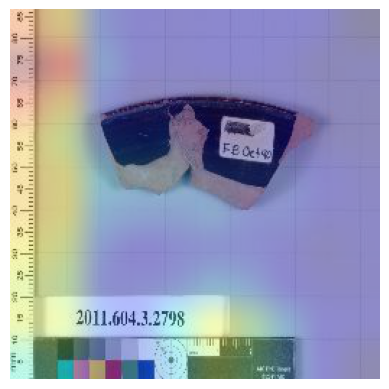

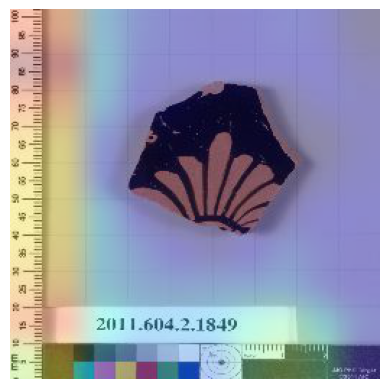

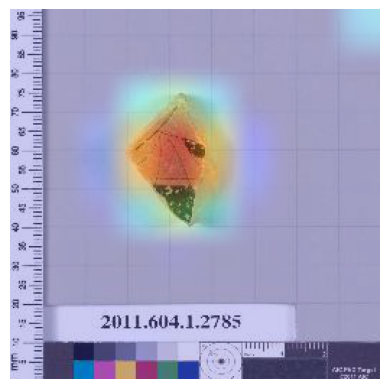

In [11]:
idx_outliers = np.where(embedding[:, 0] > 8)[0]
X_outliers = X_train[idx_outliers, :]

def gradcam(model, img, img_proc):
    import re
    from src.analysis import make_gradcam_heatmap, save_and_display_gradcam
    img_orig = img.copy()
    conv_layer_name = [layer.name for layer in model.layers if re.match(".*_[Cc]onv.*$", layer.name)][-1]
    heatmap = make_gradcam_heatmap(img_proc, model, conv_layer_name, pred_index=None)
    superimposed = save_and_display_gradcam(img_orig, heatmap)
    return superimposed

for i, x in enumerate(X_outliers):
    # plt.imshow(x)
    x2 = gradcam(model, x, resize(X_exp[idx_outliers[i]], (300, 300), preserve_range=True))
    plt.imshow(x2)
    plt.axis('off')
    plt.show()
    # plt.title("Outlier: {}".format(config.LABELS[y_exp[idx_outliers][i]]))
    # plt.show()

In [23]:
df_ext.shape

(2000, 1280)

In [12]:
reducer = umap.UMAP()
sc = StandardScaler()
df_ext_wo = df_ext[embedding[:, 0]<8]
y_labels_wo = [config.LABELS[y] for y in y_exp[embedding[:, 0]<8]]
embedding_wo = reducer.fit_transform(sc.fit_transform(df_ext_wo))
embedding_wo.shape

(1986, 2)

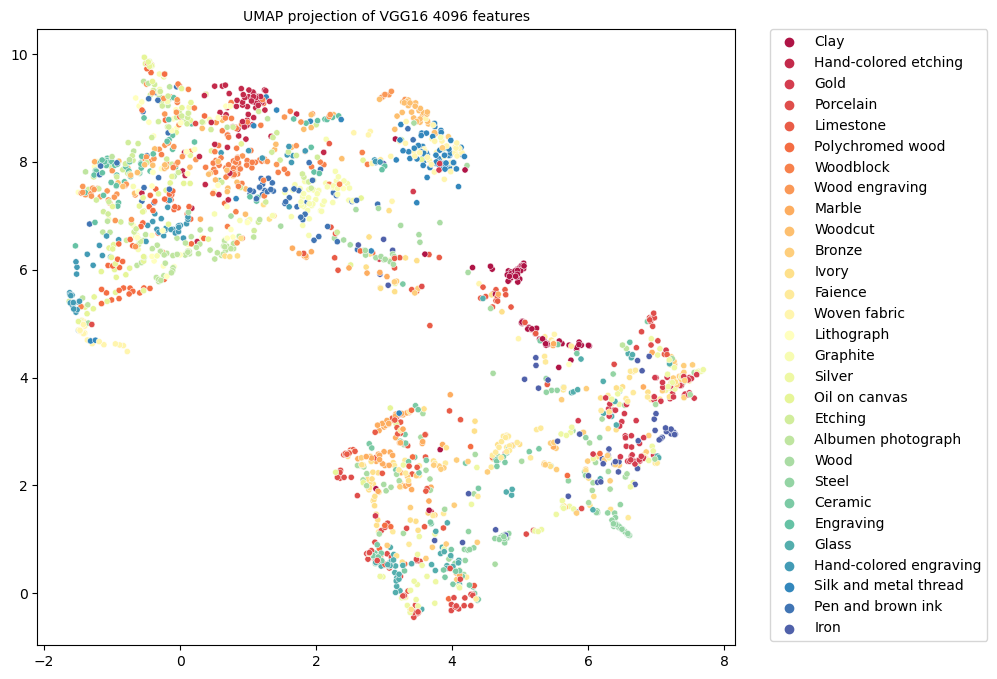

In [14]:
# REset the default matplotlib color cycle
plt.figure(figsize=(9,8))
# y_labels = [config.LABELS[y] for y in y_exp[embedding[:, 1]>1]]

sns.scatterplot(x=embedding_wo[:, 0], y=embedding_wo[:, 1], hue=y_labels_wo, marker='o', s=20,
                 palette='Spectral', legend='full')

# plt.legend([])
# place legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('UMAP projection of VGG16 4096 features', fontsize=10)

# now using plotly
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter(x=embedding_wo[:, 0], y=embedding_wo[:, 1], color=y_labels_wo)
fig.show()

In [18]:
reducer = umap.UMAP(n_components=3)
sc = StandardScaler()
df_ext_wo = df_ext[embedding[:, 0]<8]
embedding_wo = reducer.fit_transform(sc.fit_transform(df_ext_wo))


# Plot 3D t-SNE USING PLOTLY
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import plotly.io as pio

pio.templates.default = "plotly_white"
fig = px.scatter_3d(embedding_wo, x=0, y=1, z=2, color=y_labels_wo, opacity=1.)

fig.update_layout(
    title="3D UMAP projection of EfficientNetB3 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 2

fig.show()

In [20]:
config.LABELS.index("Woven fabric")

28

15


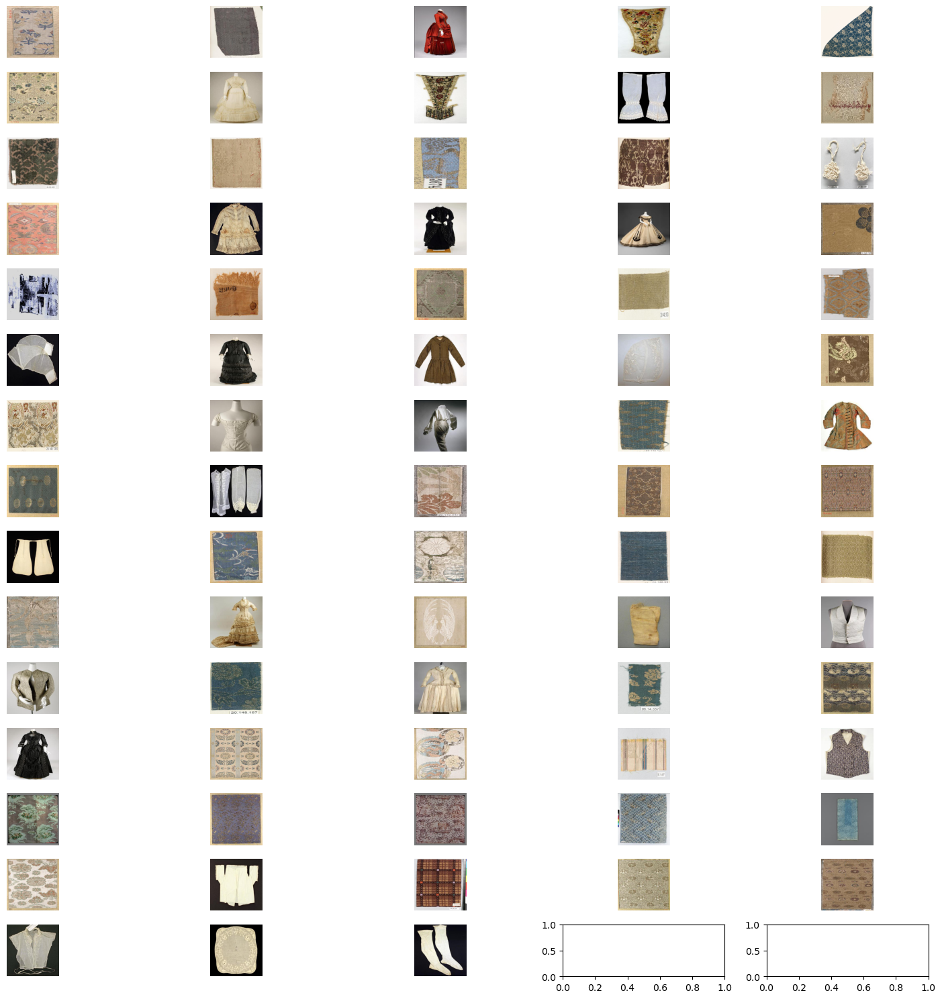

In [42]:
check_class(X_train[:2000], y_train[:2000], 'Woven fabric')

In [80]:
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
# sns.set(style='white', context='poster', rc={'figure.figsize':(10,5)})
reducer = umap.UMAP(n_components=3)
sc = StandardScaler()
embedding = reducer.fit_transform(sc.fit_transform(df_ext))
y_labels = [config.LABELS[y] for y in y_exp]
embedding.shape

fig = px.scatter_3d(embedding, x=0, y=1, z=2, color=y_labels, opacity=1.)

fig.update_layout(
    title="3D UMAP projection of EfficientNetB0 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 2

fig.show()

In [62]:
df_ext

,0,1,2,3,4,5,6,7,8,9,...,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279
0,0.457071,-0.081868,0.037860,0.370918,-0.143452,-0.003945,-0.077181,-0.131398,-0.136166,-0.187174,...,-0.125958,-0.105899,0.000200,-0.115769,0.150556,0.214056,0.373736,0.008302,0.870529,-0.130555
1,1.635342,-0.136342,-0.084038,-0.041847,-0.148859,-0.053559,0.050432,-0.109996,1.133240,-0.150882,...,-0.022424,-0.052910,-0.049263,-0.125470,-0.109942,0.049696,-0.021988,-0.107574,-0.174329,0.063949
2,-0.159259,-0.043079,0.199336,-0.081783,-0.079975,-0.147585,-0.047222,-0.084252,-0.194382,-0.166774,...,0.048642,0.450372,0.912071,-0.197452,0.001868,0.993357,-0.078952,0.350022,0.157658,-0.225219
3,-0.162512,-0.190824,-0.082041,-0.160802,-0.164168,-0.142730,0.038624,-0.160580,0.055069,-0.002344,...,-0.036990,0.487059,-0.145758,-0.099507,1.298772,-0.077162,0.031734,-0.177984,0.165732,-0.147224
4,-0.151933,-0.146568,0.160146,-0.178960,-0.123886,0.580354,-0.151456,-0.064793,-0.201914,0.234323,...,-0.133135,-0.117521,-0.157062,-0.068286,0.904678,1.362910,0.983374,-0.060958,0.202255,0.542446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.187090,-0.032635,0.385827,-0.136872,-0.113636,-0.182341,-0.146105,-0.185518,-0.068502,-0.100265,...,-0.073539,-0.059315,-0.066640,-0.069592,1.698343,-0.003715,0.067958,0.313285,0.223333,-0.208111
1996,0.676165,0.314080,-0.030142,-0.050350,-0.084566,-0.035981,0.031334,-0.131087,0.522295,-0.009495,...,-0.043279,-0.115308,-0.043157,0.141947,-0.062957,0.261562,-0.059062,-0.068890,-0.091429,1.249540
1997,-0.115137,0.135247,0.048572,-0.015125,-0.065681,-0.074937,-0.145609,-0.141064,0.120936,-0.023772,...,-0.062811,-0.132233,-0.134723,-0.072288,0.684772,-0.181667,-0.058316,0.161483,-0.105890,0.449465
1998,0.521094,-0.116847,-0.053446,-0.176015,-0.071362,0.073186,-0.091897,-0.131790,0.436410,-0.079653,...,-0.113455,-0.222352,-0.086811,1.726186,0.000022,1.279884,-0.160351,-0.124869,-0.002363,-0.146804


In [64]:
np.array(y_labels) == 'Woven fabric'

array([False, False, False, ..., False, False, False])

In [65]:
df_ext.loc[np.array(y_labels) == 'Woven fabric'].shape

(73, 1280)

In [67]:
# Get indices of z greater than 2
idx_border = np.where((embedding[:, 2] > 2)&(np.array(y_labels) == "Woven fabric"))[0]
print(idx_border)

idx_belowborder = np.where((embedding[:, 2] <= 2)&(np.array(y_labels) == "Woven fabric"))[0]
print(idx_belowborder)

[  76   78  195  265  447  491  506  527  757  765  766  791  803  891
  937 1057 1163 1207 1230 1256 1346 1693 1865 1938 1943]
[  14   59  124  125  252  275  303  393  430  439  455  589  608  619
  628  663  741  771  781  785  865  916  962  978 1031 1070 1079 1080
 1104 1153 1169 1181 1238 1269 1292 1376 1386 1422 1458 1483 1498 1500
 1523 1570 1671 1758 1762 1815]


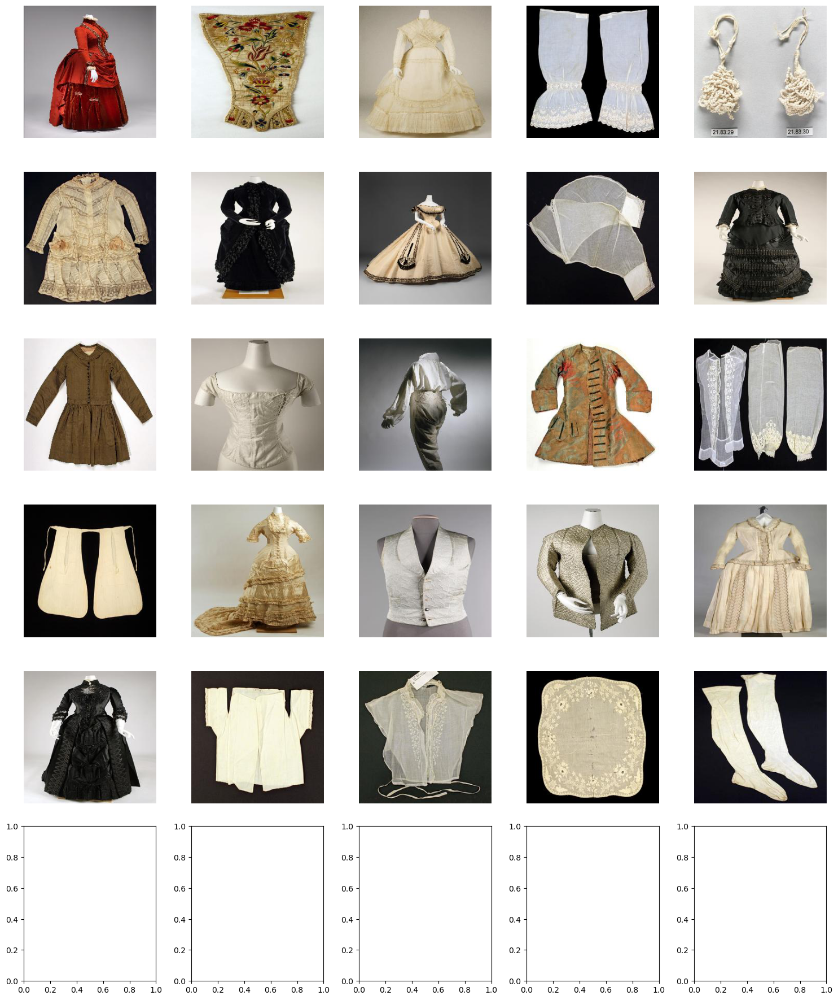

In [78]:
wf_type1 = X_train[idx_border]
wf_type2 = X_train[idx_belowborder]

check_class(wf_type1, y_train[idx_border], 'Woven fabric')

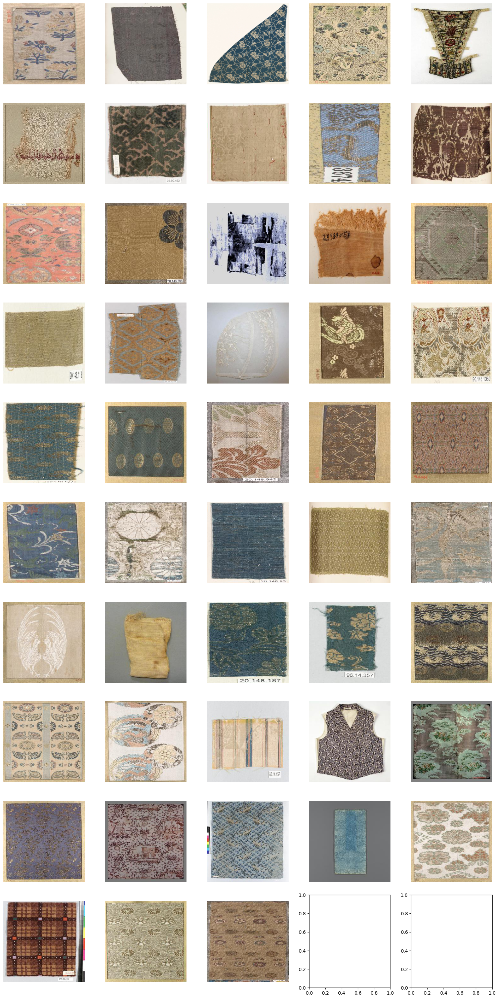

In [79]:
check_class(wf_type2, y_train[idx_belowborder], 'Woven fabric')

Text(0.5, 1.0, 'T-SNE projection of EfficientNetB0 1280 features')

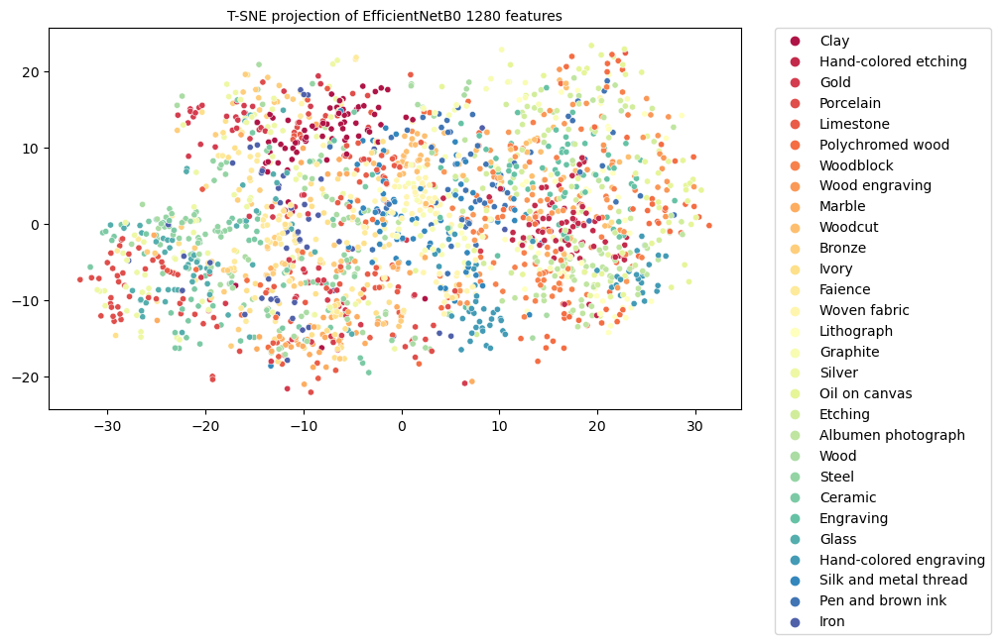

In [32]:
# Use t-sne to visualize the data
from sklearn.manifold import TSNE
tsne = TSNE(n_components=3, random_state=42)
sc = StandardScaler()
X_embedded = tsne.fit_transform(sc.fit_transform(df_ext_wo))
X_embedded.shape

# REset the default matplotlib color cycle
plt.figure(figsize=(9,5))
y_labels = [config.LABELS[y] for y in y_exp[embedding[:, 1]>1]]

sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1], hue=y_labels, marker='o', s=20,
                 palette='Spectral', legend='full')
# plt.legend([])
# place legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('T-SNE projection of EfficientNetB0 1280 features', fontsize=10)

In [19]:
%reload_ext plotly.express

In [33]:
# Plot 3D t-SNE USING PLOTLY
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import plotly.io as pio

pio.templates.default = "plotly_white"
fig = px.scatter_3d(X_embedded, x=0, y=1, z=2, color=y_labels, opacity=1.)

fig.update_layout(
    title="3D t-SNE projection of EfficientNetB0 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 2

fig.show()

In [21]:
# use pca to reduce the dimensionality
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
sc = StandardScaler()
X_embedded = pca.fit_transform(sc.fit_transform(df_ext_wo))
X_embedded.shape

pio.templates.default = "plotly_white"
fig = px.scatter_3d(X_embedded, x=0, y=1, z=2, color=y_labels_wo, opacity=1.)

fig.update_layout(
    title="3D PCA projection of EfficientNetB0 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 2

fig.show()

Text(0.5, 1.0, '0.9 Explained variance 448 components')

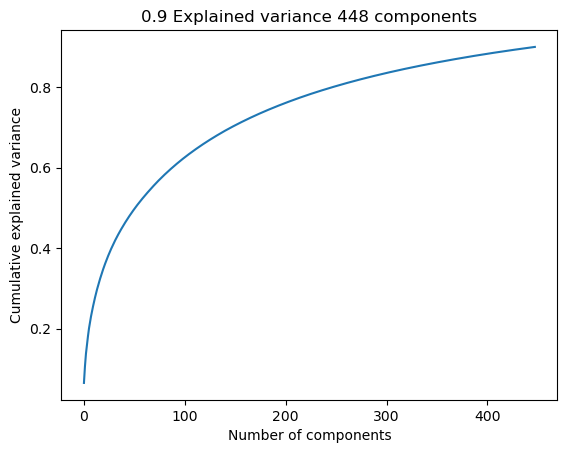

In [22]:
# plot explained variance for 100 components
pct_explained = .9
pca = PCA(n_components=pct_explained)
sc = StandardScaler()
pca.fit_transform(sc.fit_transform(df_ext_wo))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance');
plt.title(f"{pct_explained} Explained variance {pca.n_components_} components")

In [20]:
# X_ceramic = X_train[np.where(y_train == 2)[0], :]
# for x in X_ceramic:
#     plt.imshow(x)
#     plt.title("Ceramic")
#     plt.show()

## Add a classifier on top of the convolutional base

In [26]:
def add_classifier(model, ls_layers,
                   n_classes=config.N_CLASSES,
                   scale_orig=1/255.0):
    
    # Freeze the layers which you don't want to train. Here I am freezing the first 10 layers.
    model.trainable = False

    # Create new model on top
    inputs = keras.Input(shape=(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS))

    scale_layer = keras.layers.Rescaling(scale=scale_orig)
    x = scale_layer(inputs)

    model_layers = model.layers[1:]

    for layer in model_layers + ls_layers:
        x = layer(x)

    outputs = keras.layers.Dense(n_classes, activation='softmax')(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    
    return model

ls_classifiers = [keras.layers.Flatten(),
                  keras.layers.Dense(1024, activation='relu'),
                  keras.layers.Dropout(0.3),
                  keras.layers.Dense(512, activation='relu'),]

model_clas = add_classifier(model, ls_classifiers)
model_clas.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584

## Train Model

In [27]:
LEARNING_RATE = 0.001
BATCH_SIZE = 32
EPOCHS = 10

train_generator = CustomDataGenerator(X_train, y_train, BATCH_SIZE)

In [28]:
model_clas = add_classifier(model, ls_classifiers)

# compile the model 
model_clas.compile(loss = "sparse_categorical_crossentropy", 
                    optimizer = keras.optimizers.legacy.Adam(lr=LEARNING_RATE), 
                    metrics=["accuracy"])

In [29]:
history = model_clas.fit(train_generator,
                            epochs=EPOCHS,
                            batch_size=BATCH_SIZE,
                            validation_data=(X_val, y_val),
                            verbose=1)

Epoch 1/10
635/635 [==============================] - 76s 119ms/step - loss: 2.1324 - accuracy: 0.3725 - val_loss: 1.4923 - val_accuracy: 0.5262
Epoch 2/10
635/635 [==============================] - 76s 119ms/step - loss: 1.5492 - accuracy: 0.5072 - val_loss: 1.3392 - val_accuracy: 0.5800
Epoch 3/10
635/635 [==============================] - 76s 119ms/step - loss: 1.3105 - accuracy: 0.5681 - val_loss: 1.3035 - val_accuracy: 0.5614
Epoch 4/10
635/635 [==============================] - 76s 119ms/step - loss: 1.1903 - accuracy: 0.6089 - val_loss: 1.2067 - val_accuracy: 0.6014
Epoch 5/10
635/635 [==============================] - 76s 120ms/step - loss: 1.0473 - accuracy: 0.6536 - val_loss: 1.1321 - val_accuracy: 0.6324
Epoch 6/10
635/635 [==============================] - 76s 119ms/step - loss: 0.9632 - accuracy: 0.6780 - val_loss: 1.1344 - val_accuracy: 0.6303
Epoch 7/10
635/635 [==============================] - 75s 119ms/step - loss: 0.8988 - accuracy: 0.6989 - val_loss: 1.1150 - val_ac

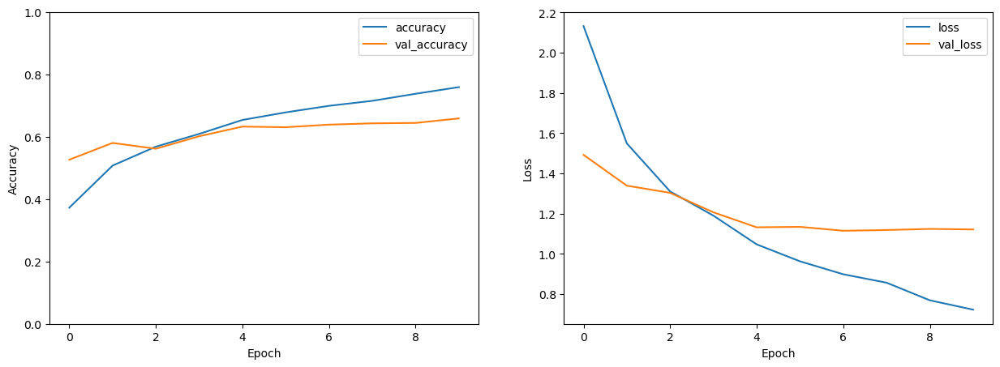

In [30]:
%reload_ext src.results
from src.results import plot_history
plot_history(model_clas);